# Feature extraction

## Notebook setup

In [1]:
from canon.utils import image_utils
from canon.utils import notebook_utils

from canon.T1.process import feature_extraction
import cv2
import matplotlib.pyplot as plt

In [2]:
images = image_utils.load_images("T1/raw/FotosICMural")
print("load sucess")

load sucess


## SIFT

O mais robusto e usado detector de keypoints

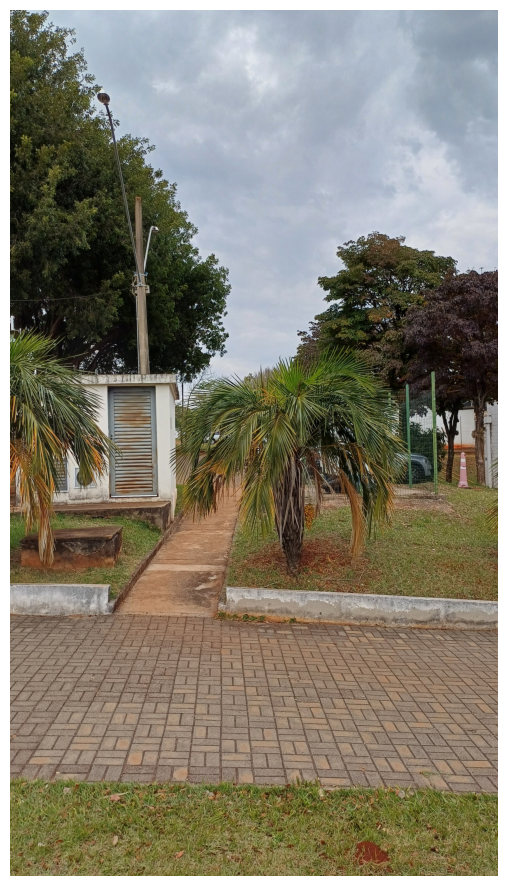

In [3]:
image = images["1"]
notebook_utils.show_image(image)

In [4]:
keypoints_sift, descriptors_sift = feature_extraction.SIFT(image)
print(f"Detectado {len(keypoints_sift)} keypoints!")

Detectado 157572 keypoints!


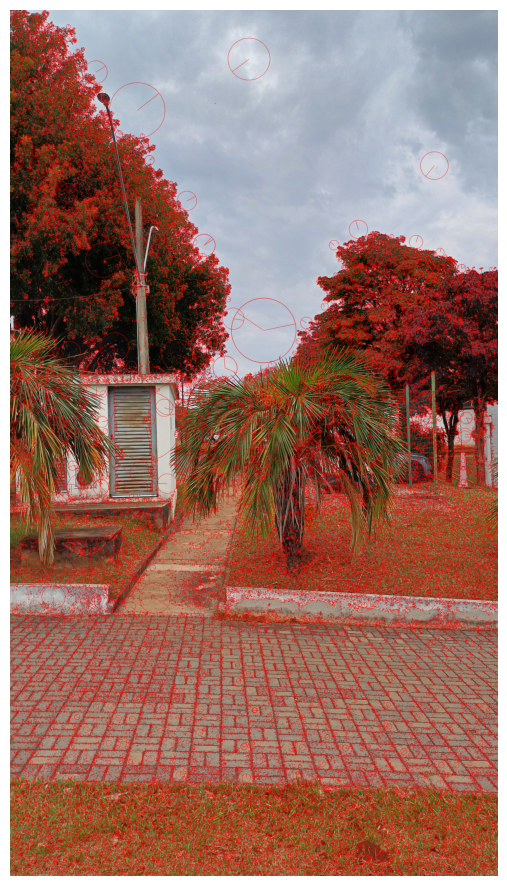

In [5]:
#imagem com keypoints
notebook_utils.show_image_with_keypoints(image, keypoints_sift)

In [6]:
# como um descriptor se parece

print(descriptors_sift[0].shape)
print(descriptors_sift[0])

(128,)
[  0.   0.   0.   0.   0.   0.   0.   0.   7.   3.   0.   0.   0.   0.
   1.   4.  53.  28.   0.   0.   0.   5.  60.  44. 122.  94.   4.  22.
  52.   6.  25.  43.   0.   0.   0.   0.   3.   4.   0.   0.  85.  21.
   1.   0.  23.  27.   3.  14. 122.  46.  25.   6.   1.   7. 110. 122.
  50.  15.  72.  56.  75.  13.  88. 122.   0.   0.   2.   2.  23.  24.
   2.   0.  46.   7.   3.   2.  55.  73.  34.  88. 122.  66.  88.  65.
  38.   4.  19.  90.  67.  74. 122.  81.  32.  18.   7.   7.   1.   8.
  33.  66.  25.   9.   1.   3.  15.  38.  53.  29.  12.  17.  13.  26.
  27.  36.  37.  35.  52.  26.  29.  42.  61.  50.  19.  16.  16.  53.
  33.   9.]


In [7]:
img_with_keypoints = cv2.drawKeypoints(
        image, keypoints_sift, None, 
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, 
        color=(0, 0, 255)  # bright red for visibility
    )

success = image_utils.save_image(img_with_keypoints, "SIFT_keypoints", path = "interim", img_format="jpg")

if success:
    print(f"Image saved successfully")
else:
    print("Failed to save image")

Image saved successfully


## ORB

In [8]:
keypoints_orb, descriptors_orb = feature_extraction.ORB(image)
print(f"Detectado {len(keypoints_orb)} keypoints!")

Detectado 500 keypoints!


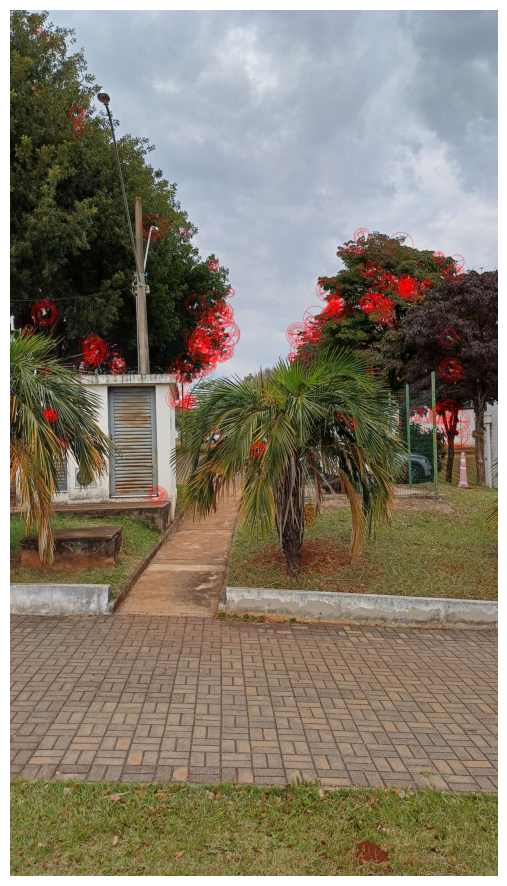

In [9]:
#imagem com keypoints
notebook_utils.show_image_with_keypoints(image, keypoints_orb)

Por padrão, o ORB se limita a 500 keypoints.

In [10]:
img_with_keypoints = cv2.drawKeypoints(
        image, keypoints_orb, None, 
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, 
        color=(0, 0, 255)  # bright red for visibility
    )

success = image_utils.save_image(img_with_keypoints, "ORB_keypoints", path = "interim", img_format="jpg")

if success:
    print(f"Image saved successfully")
else:
    print("Failed to save image")

Image saved successfully


## AKAZE

In [11]:
keypoints_akaze, descriptors_akaze = feature_extraction.AKAZE(image)
print(f"Detectado {len(keypoints_akaze)} keypoints!")

Detectado 41068 keypoints!


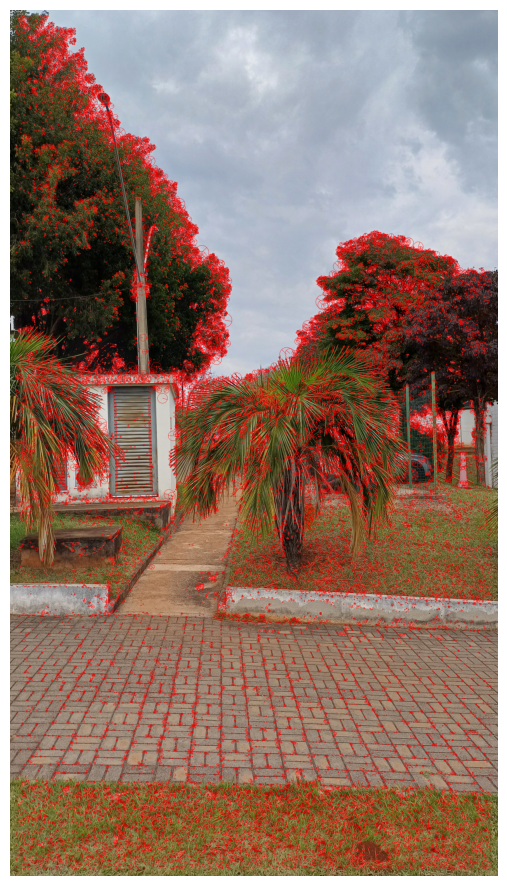

In [12]:
#imagem com keypoints
notebook_utils.show_image_with_keypoints(image, keypoints_akaze)

In [13]:
img_with_keypoints = cv2.drawKeypoints(
        image, keypoints_akaze, None, 
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, 
        color=(0, 0, 255)  # bright red for visibility
    )

success = image_utils.save_image(img_with_keypoints, "AKAZE_keypoints", path = "interim", img_format="jpg")

if success:
    print(f"Image saved successfully")
else:
    print("Failed to save image")

Image saved successfully


## Comparação

### Formato dos descritores

In [14]:
d_sift = descriptors_sift[0]
print("SIFT descriptor")
print("Shape:", d_sift.shape)
print("Dtype:", d_sift.dtype)
print("Values:\n", d_sift)
print("-" * 50)


SIFT descriptor
Shape: (128,)
Dtype: float32
Values:
 [  0.   0.   0.   0.   0.   0.   0.   0.   7.   3.   0.   0.   0.   0.
   1.   4.  53.  28.   0.   0.   0.   5.  60.  44. 122.  94.   4.  22.
  52.   6.  25.  43.   0.   0.   0.   0.   3.   4.   0.   0.  85.  21.
   1.   0.  23.  27.   3.  14. 122.  46.  25.   6.   1.   7. 110. 122.
  50.  15.  72.  56.  75.  13.  88. 122.   0.   0.   2.   2.  23.  24.
   2.   0.  46.   7.   3.   2.  55.  73.  34.  88. 122.  66.  88.  65.
  38.   4.  19.  90.  67.  74. 122.  81.  32.  18.   7.   7.   1.   8.
  33.  66.  25.   9.   1.   3.  15.  38.  53.  29.  12.  17.  13.  26.
  27.  36.  37.  35.  52.  26.  29.  42.  61.  50.  19.  16.  16.  53.
  33.   9.]
--------------------------------------------------


In [15]:
# --- ORB ---
d_orb = descriptors_orb[0]
print("ORB descriptor")
print("Shape:", d_orb.shape)
print("Dtype:", d_orb.dtype)
print("Values:\n", d_orb)
print("-" * 50)

ORB descriptor
Shape: (32,)
Dtype: uint8
Values:
 [ 33 245 122 107 240 141 255 124 104 136 125 100 183 243 196  48  30  43
   6 120 145  58 220 126 108 140  38 232 217 130 227 169]
--------------------------------------------------


In [16]:
# --- AKAZE ---
d_akaze = descriptors_akaze[0]
print("AKAZE descriptor")
print("Shape:", d_akaze.shape)
print("Dtype:", d_akaze.dtype)
print("Values:\n", d_akaze)

AKAZE descriptor
Shape: (61,)
Dtype: uint8
Values:
 [  7 176 236   5 128   7  10 130  97   8 160   0 189  46  85 202 253 111
 130  72   0   0 240 191  56   0 244 249  62  17 200 239   0   0  64   0
 116 176 131  14   0 252   3   0  64  10  40  65  91 233 127 150 240 191
  18   4 252   1 148   6   3]


Vemos que o SIFT contém o maior descriptor (128 valores), seguido pelo AKAZE (61 valores) e o ORB (32 valores). Além disso, o SIFT tem tipo float enquanto os outros tem tipo uint8

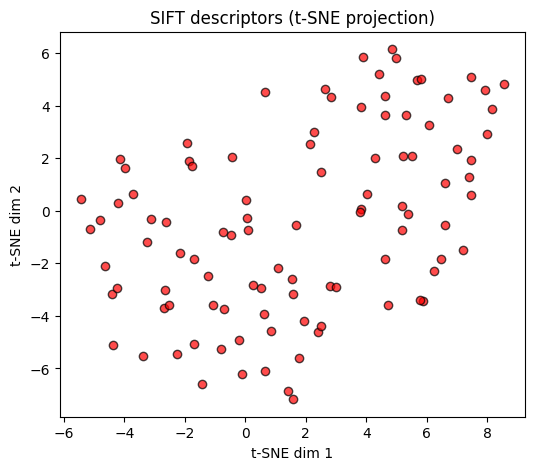

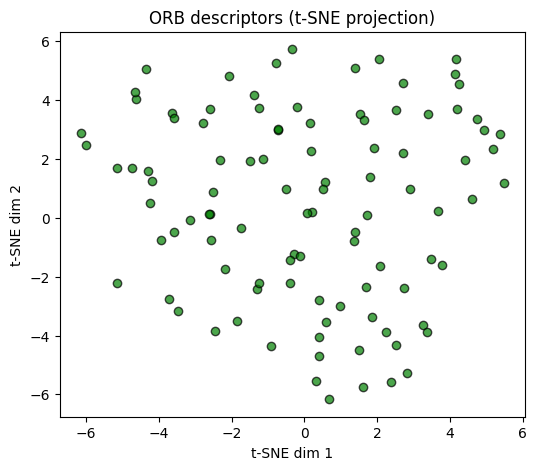

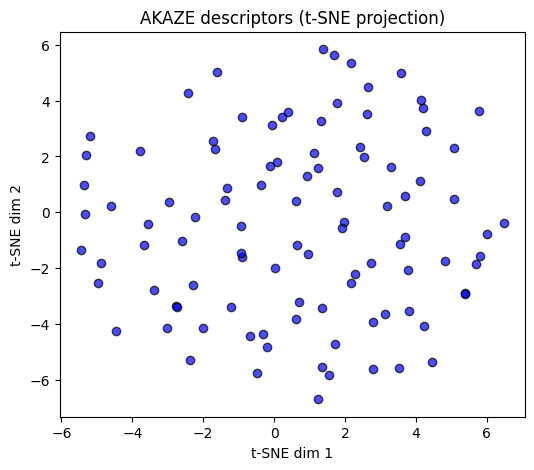

In [17]:
# vendo a capacidade de separação
from sklearn.manifold import TSNE
import numpy as np

# Selecionar até 100 descritores de cada (para não ficar lento)
N = 100
desc_sift = descriptors_sift[:N].astype(np.float32)   # já é float32
desc_orb  = descriptors_orb[:N].astype(np.float32)    # ORB é uint8 → converter
desc_akaze= descriptors_akaze[:N].astype(np.float32)  # AKAZE MLDB é uint8 → converter

# Run t-SNE separately for each
def plot_tsne(descriptors, title, color):
    tsne = TSNE(n_components=2, init="random", random_state=42, perplexity=30)
    X_2d = tsne.fit_transform(descriptors)
    
    plt.figure(figsize=(6,5))
    plt.scatter(X_2d[:,0], X_2d[:,1], c=color, alpha=0.7, edgecolors="k")
    plt.title(f"{title} descriptors (t-SNE projection)")
    plt.xlabel("t-SNE dim 1")
    plt.ylabel("t-SNE dim 2")
    plt.show()

plot_tsne(desc_sift, "SIFT", "red")
plot_tsne(desc_orb, "ORB", "green")
plot_tsne(desc_akaze, "AKAZE", "blue")

Os 3 possuem capacidades de dispersão parecidas.

### Localização dos keypoints

Agora vamos ver como os keypoints se distribuem na imagem. Vamos usar apenas os 500 keypoints mais importantes segundo cada técnica, para ser possível uma comparação visual.

In [18]:
image = images["2"]
# Extract descriptors
kp_sift, desc_sift = feature_extraction.SIFT(image, nfeatures=500)
kp_orb, desc_orb = feature_extraction.ORB(image, nfeatures=500)
kp_akaze, desc_akaze = feature_extraction.AKAZE(image, threshold=0.01449) #magic number, gives 500 outputs for this specific image

Text(0.5, 1.0, 'SIFT 500 keypoints')

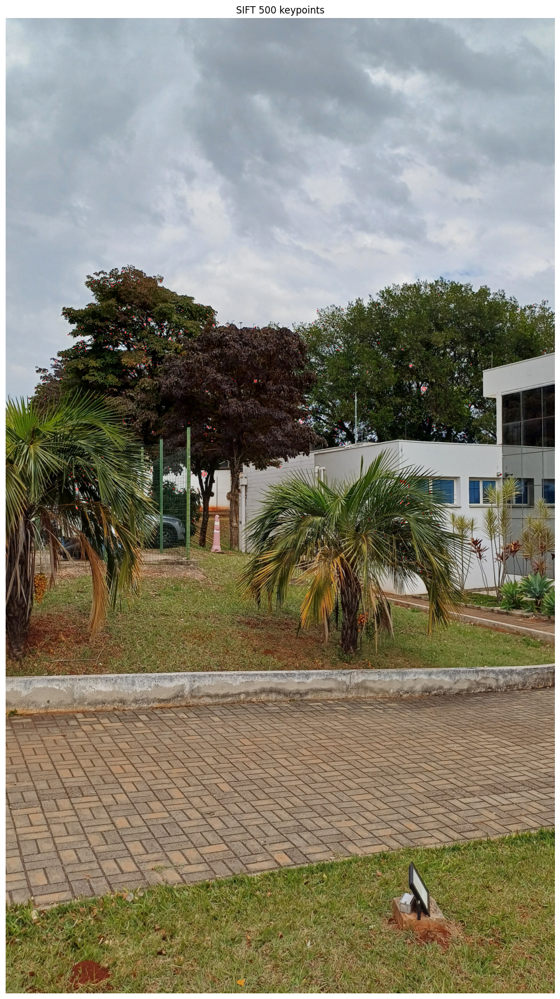

In [19]:
notebook_utils.show_image_with_keypoints(image, kp_sift, pixel_size=0.01)
plt.title("SIFT 500 keypoints")

Text(0.5, 1.0, 'ORB 500 keypoints')

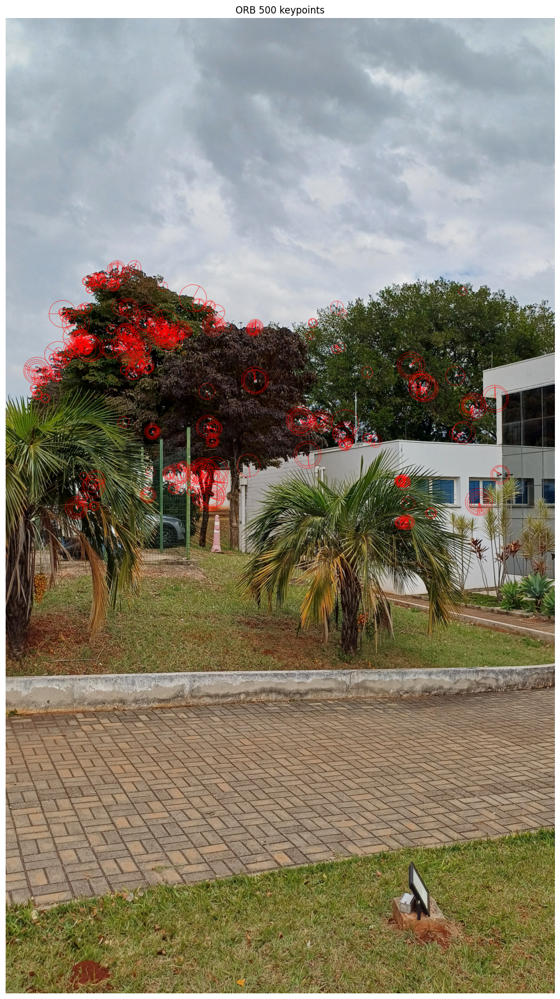

In [20]:
notebook_utils.show_image_with_keypoints(image, kp_orb, pixel_size=0.01)
plt.title("ORB 500 keypoints")

Text(0.5, 1.0, 'AKAZE 500 keypoints')

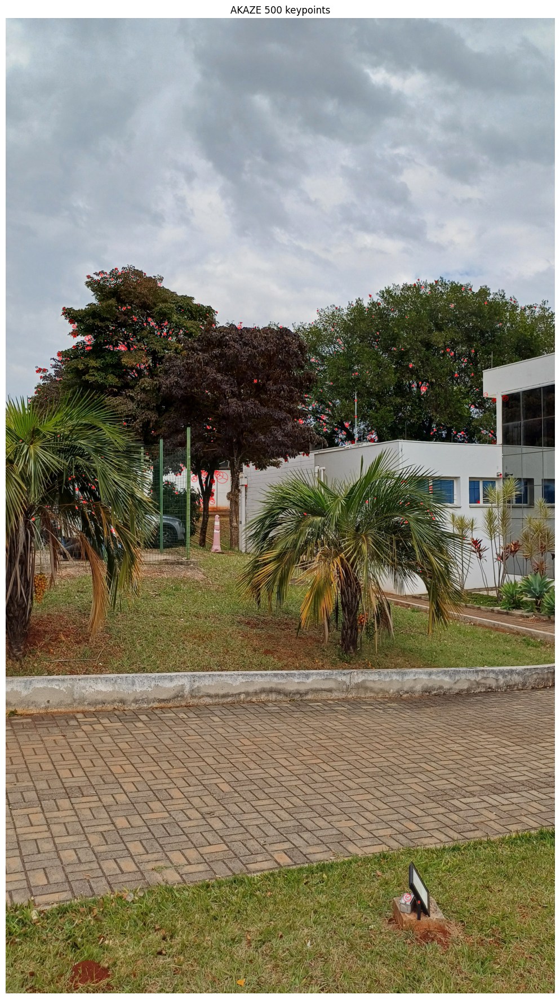

In [21]:
notebook_utils.show_image_with_keypoints(image, kp_akaze, pixel_size=0.01)
plt.title("AKAZE 500 keypoints")

Podemos ver que a diferença principal se dá no tamanho dos keypoints:
- SIFT possui keypoints muito pequenos, quase imperceptíveis. Praticamente todos estão nas árvores
- ORB já possui keypoints bem grandes, que estão melhor distribuídos, com alguns na edificação.
- AKAZE possui keypoints pequenos, mas não tão pequenos como o SIFT. Estão também bem distribuídos

### Eficiência

Vamos comparar o tempo necessário dos algoritmos para rodar

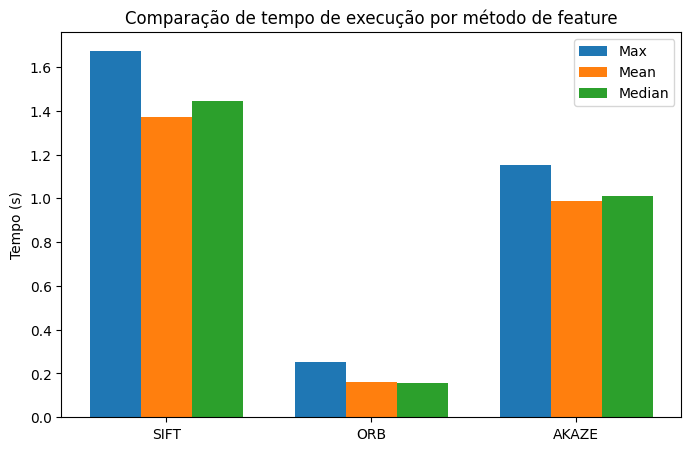

{'SIFT': {'max': np.float64(1.6744834259998242), 'mean': np.float64(1.3698870833887768), 'median': np.float64(1.4437422314999822)}, 'ORB': {'max': np.float64(0.2541956499999287), 'mean': np.float64(0.16086147838895057), 'median': np.float64(0.1582017440000527)}, 'AKAZE': {'max': np.float64(1.1510828199998286), 'mean': np.float64(0.987522293222254), 'median': np.float64(1.0100121130003572)}}


In [22]:
import time

def compare_feature_times(images: dict):
    """
    Compara os tempos de execução de SIFT, ORB e AKAZE em um conjunto de imagens,
    retorna os tempos estatísticos e plota gráfico comparativo.

    Args:
        images: dicionário com imagens {nome: np.ndarray}.

    Returns:
        dict com estatísticas de tempo por método:
        {
            "SIFT": {"max": ..., "mean": ..., "median": ...},
            "ORB": {...},
            "AKAZE": {...}
        }
    """
    methods = ["SIFT", "ORB", "AKAZE"]
    times = {m: [] for m in methods}

    # Medir tempos
    for image in images.values():
        start = time.perf_counter()
        _, _ = feature_extraction.SIFT(image, nfeatures=500)
        times["SIFT"].append(time.perf_counter() - start)

        start = time.perf_counter()
        _, _ = feature_extraction.ORB(image, nfeatures=500)
        times["ORB"].append(time.perf_counter() - start)

        start = time.perf_counter()
        _, _ = feature_extraction.AKAZE(image, threshold=0.01449)
        times["AKAZE"].append(time.perf_counter() - start)

    # Calcular estatísticas
    stats = {}
    for m in methods:
        t = np.array(times[m])
        stats[m] = {
            "max": t.max(),
            "mean": t.mean(),
            "median": np.median(t)
        }

    # Plotar gráfico
    x_labels = methods
    max_vals = [stats[m]["max"] for m in methods]
    mean_vals = [stats[m]["mean"] for m in methods]
    median_vals = [stats[m]["median"] for m in methods]

    x = np.arange(len(methods))
    width = 0.25

    plt.figure(figsize=(8,5))
    plt.bar(x - width, max_vals, width, label="Max")
    plt.bar(x, mean_vals, width, label="Mean")
    plt.bar(x + width, median_vals, width, label="Median")

    plt.xticks(x, x_labels)
    plt.ylabel("Tempo (s)")
    plt.title("Comparação de tempo de execução por método de feature")
    plt.legend()
    plt.show()

    return stats

# Uso
stats = compare_feature_times(images)
print(stats)

Vemos uma clara diferença de eficiência. ORB é muito rápido em comparação aos outros 2, o que é coerente com o fato de retornar apenas 31 features. AKAZE e SIFT são bem pesados, com AKAZE sendo um pouco mais rápido.

### Escolha

Considerando a distribuição dos keypoints na imagem, acredito que AKAZE e ORB se saíram melhor, com keypoints melhor distruibuídos. Entre os dois, considero que AKAZE seria o ideal pelos keypoints serem menores, o que talvez facilite o emparelhamento.